# Tissue-Specific Hit Calling
**Kexin Dong | B-ALL In Vivo Base Editing Screen**

---

## Guide-level filtering (applied before hit calling)

| Filter | Focused screens | OG screens |
|---|---|---|
| `Input_median` | ≥ 2 | ≥ 2 |
| `sensor_reads_{cond}` | ≥ 100 (any tissue) | ≥ 100 (any tissue) |
| `target_base_edit_perc_{cond}` | ≥ 20% (any tissue) | ≥ 20% (any tissue) |

---

## Hit category definitions

All categories use **LFC median** effect, **Fisher's combined p-value** FDR method, with thresholds **FDR < 0.1** and **|LFC| > 1**.

**"Not a strong enricher in tissue X"** = NOT (FDR < 0.1 AND LFC ≥ 1)  
This captures three allowed states: (1) not significant, (2) significant but weak enricher (0 < LFC < 1), or (3) significant depleter (LFC < 0).

### 1. In Vitro-Specific
- FDR < 0.1 AND LFC > 1 at **d15**
- Not a strong enricher in **all** in vivo tissues (spleen, BM, ± meninges)

### 2. In Vivo-Specific
- Not a strong enricher at **d15**
- FDR < 0.1 AND LFC > 1 in **at least one** in vivo tissue

### 3. Spleen-Specific
- FDR < 0.1 AND LFC > 1 in **spleen**
- Not a strong enricher in **d15** and **BM**

### 4. BM-Specific
- FDR < 0.1 AND LFC > 1 in **BM**
- Not a strong enricher in **d15** and **spleen**

---

## Screens compared

| Label | ABE key | CBE key | Conditions | Notes |
|---|---|---|---|---|
| GJ/JA T0 | ABE_EPO_T0 | CBE_EPO_T0 | d15, spleen, BM | Focused, T0-anchored |
| GJ/JA BC | ABE_EPO_BC | CBE_EPO_BC | d15, spleen, BM | Focused, BC-anchored |
| FSR T0 | ABE_EPO_T0_FSR | CBE_EPO_T0_FSR | d15, spleen, BM | FSR replicates |
| FSR BC | ABE_EPO_BC_FSR | CBE_EPO_BC_FSR | d15, spleen, BM | FSR replicates |
| OG | ABE_OG | CBE_OG | d15, spleen, BM, meninges | OG library |


In [2]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import scipy.stats
from sklearn.decomposition import PCA
from adjustText import adjust_text
from matplotlib_venn import venn2, venn3
from upsetplot import UpSet, from_indicators
import warnings
import os
warnings.filterwarnings('ignore')

# ── Global style (matching published figures) ─────────────────────────────────────────
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype']  = 42
mpl.rcParams['text.usetex']  = False
plt.rcParams['font.family']     = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica']

blues   = sns.color_palette('Blues').as_hex()
greens  = sns.color_palette('Greens').as_hex()
reds    = sns.color_palette('Reds').as_hex()
yellows = sns.color_palette('Oranges').as_hex()
purples = sns.color_palette('Purples').as_hex()

greys = sns.color_palette('Greys').as_hex()
teals = sns.color_palette('BuPu').as_hex()
pinks = sns.color_palette('RdPu').as_hex()
browns = sns.color_palette('YlOrBr').as_hex()
BASE = '/Users/kexindong/Documents/GitHub/B-ALL-in-vivo-base-editing/'

In [3]:
BASE = '/Users/kexindong/Documents/GitHub/B-ALL-in-vivo-base-editing/'

dfs = {
    'ABE_OG':         pd.read_csv(BASE + 'LFC-FDR/ABE_OG_LFC_FDR.csv', low_memory=False),
    'CBE_OG':         pd.read_csv(BASE + 'LFC-FDR/CBE_OG_LFC_FDR.csv', low_memory=False),
    'ABE_EPO_T0':     pd.read_csv(BASE + 'LFC-FDR/ABE_FC_EPO_T0_LFC_FDR.csv', low_memory=False),
    'CBE_EPO_T0':     pd.read_csv(BASE + 'LFC-FDR/CBE_FC_EPO_T0_LFC_FDR.csv', low_memory=False),
    'ABE_EPO_BC':     pd.read_csv(BASE + 'LFC-FDR/ABE_FC_EPO_TO_BC_LFC_FDR.csv', low_memory=False),
    'CBE_EPO_BC':     pd.read_csv(BASE + 'LFC-FDR/CBE_FC_EPO_TO_BC_LFC_FDR.csv', low_memory=False),
    'ABE_BC_T0':      pd.read_csv(BASE + 'LFC-FDR/ABE_FC_BC_T0_LFC_FDR.csv', low_memory=False),
    'CBE_BC_T0':      pd.read_csv(BASE + 'LFC-FDR/CBE_FC_BC_T0_LFC_FDR.csv', low_memory=False),
    'ABE_EPO_T0_FSR': pd.read_csv(BASE + 'LFC-FDR/ABE_FC_EPO_T0_LFC_FDR_FSR.csv', low_memory=False),
    'CBE_EPO_T0_FSR': pd.read_csv(BASE + 'LFC-FDR/CBE_FC_EPO_T0_LFC_FDR_FSR.csv', low_memory=False),
    'ABE_EPO_BC_FSR': pd.read_csv(BASE + 'LFC-FDR/ABE_FC_EPO_TO_BC_LFC_FDR_FSR.csv', low_memory=False),
    'CBE_EPO_BC_FSR': pd.read_csv(BASE + 'LFC-FDR/CBE_FC_EPO_TO_BC_LFC_FDR_FSR.csv', low_memory=False),
    'ABE_BC_T0_FSR':  pd.read_csv(BASE + 'LFC-FDR/ABE_FC_BC_T0_LFC_FDR_FSR.csv', low_memory=False),
    'CBE_BC_T0_FSR':  pd.read_csv(BASE + 'LFC-FDR/CBE_FC_BC_T0_LFC_FDR_FSR.csv', low_memory=False),
}

# Conditions with FDR calculated
conds_og      = ['d15', 'bm', 'spleen', 'men']
conds_focused = ['d15', 'bm', 'spleen']

# Per-replicate raw count columns per condition per screen
rep_cols = {
    'ABE_OG':         {'bm':    ['bonemarrow1','bonemarrow2','bonemarrow3','bonemarrow4','bonemarrow5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4'],
                       'men':   ['meninges1','meninges2','meninges3','meninges4','meninges5'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'CBE_OG':         {'bm':    ['bonemarrow1','bonemarrow2','bonemarrow3','bonemarrow4','bonemarrow5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4'],
                       'men':   ['meninges1','meninges2','meninges3','meninges4','meninges5'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'ABE_EPO_T0':     {'bm':    ['bm1','bm2','bm3','bm4','bm5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4','spleen5'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'CBE_EPO_T0':     {'bm':    ['bm1','bm3','bm4','bm6','bm7','bm9','bm10'],
                       'spleen':['spleen1','spleen3','spleen4','spleen6','spleen7','spleen9','spleen10'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'ABE_EPO_BC':     {'bm':    ['bm1','bm3','bm5'],
                       'spleen':['spleen1','spleen3'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'CBE_EPO_BC':     {'bm':    ['bm1','bm3','bm4','bm6','bm7','bm9','bm10'],
                       'spleen':['spleen1','spleen3','spleen4','spleen6','spleen7','spleen9','spleen10'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'ABE_BC_T0':      {'bm':    ['bm1','bm3','bm5'],
                       'spleen':['spleen1','spleen3'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    'CBE_BC_T0':      {'bm':    ['bm1','bm3','bm4','bm5','bm7','bm8','bm9'],
                       'spleen':['spleen1','spleen3','spleen4','spleen5','spleen7','spleen8','spleen9'],
                       'd15':   ['d15_rep1','d15_rep2','d15_rep3']},
    # FSR screens — d15 cols are 'd15-1','d15-2','d15-3'
    'ABE_EPO_T0_FSR': {'bm':    ['bm1','bm2','bm3','bm4','bm5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4','spleen5'],
                       'd15':   ['d15-1','d15-2','d15-3']},
    'CBE_EPO_T0_FSR': {'bm':    ['bm1','bm3','bm4','bm5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4','spleen5'],
                       'd15':   ['d15-1','d15-2','d15-3']},
    'ABE_EPO_BC_FSR': {'bm':    ['bm1','bm2','bm3','bm4','bm5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4','spleen5'],
                       'd15':   ['d15-1','d15-2','d15-3']},
    'CBE_EPO_BC_FSR': {'bm':    ['bm1','bm3','bm4','bm5'],
                       'spleen':['spleen1','spleen2','spleen3','spleen4','spleen5'],
                       'd15':   ['d15-1','d15-2','d15-3']},
    'ABE_BC_T0_FSR':  {'bm':    ['bm1','bm2','bm3','bm4','bm5'],
                       'spleen':['spleen1','spleen2','spleen4','spleen5'],
                       'd15':   ['d15-1','d15-2','d15-3']},
    'CBE_BC_T0_FSR':  {'bm':    ['bm2','bm3','bm4','bm5'],
                       'spleen':['spleen2','spleen3','spleen4','spleen5'],
                       'd15':   ['d15-1','d15-2','d15-3']},
}

# COSMIC cancer gene census
cosmic = pd.read_csv(BASE + 'source-data/Census_allSun Nov 17 02_26_47 2024.csv').fillna('Undefined')
t_dict = {
    'TSG': 'TSG', 'TSG, fusion': 'TSG',
    'Undefined': 'Undefined', 'fusion': 'Undefined',
    'oncogene': 'Oncogene',
    'oncogene, TSG': 'Oncogene/TSG', 'oncogene, TSG, fusion': 'Oncogene/TSG',
    'oncogene, fusion': 'Oncogene',
}
color_dict = {'Oncogene':'tab:red', 'Oncogene/TSG':'tab:purple',
              'TSG':'tab:blue', 'Undefined':'tab:grey'}

def add_cosmic(df):
    gene_col = 'gene_name_h' if 'gene_name_h' in df.columns else 'Gene'
    roles = []
    for v in df[gene_col]:
        sub = cosmic[cosmic['Gene Symbol'] == v]
        roles.append('Undefined' if len(sub)==0 else t_dict.get(sub['Role in Cancer'].values[0], 'Undefined'))
    df = df.copy()
    df['Role in Cancer'] = roles
    df['color'] = [color_dict[r] for r in roles]
    return df

for key in dfs:
    dfs[key] = add_cosmic(dfs[key])

print('Loaded:')
for k, v in dfs.items():
    print(f'  {k}: {len(v)} guides')


Loaded:
  ABE_OG: 1070 guides
  CBE_OG: 13242 guides
  ABE_EPO_T0: 376 guides
  CBE_EPO_T0: 1257 guides
  ABE_EPO_BC: 376 guides
  CBE_EPO_BC: 1257 guides
  ABE_BC_T0: 376 guides
  CBE_BC_T0: 1257 guides
  ABE_EPO_T0_FSR: 376 guides
  CBE_EPO_T0_FSR: 1257 guides
  ABE_EPO_BC_FSR: 376 guides
  CBE_EPO_BC_FSR: 1257 guides
  ABE_BC_T0_FSR: 376 guides
  CBE_BC_T0_FSR: 1257 guides


In [5]:
# ── replicate column maps
_ABE_SAMP = {           # focused EPO screens
    'bm':     ['bm1','bm3','bm4','bm5'],
    'spleen': ['spleen1','spleen3','spleen4','spleen5'],
    'd15':    ['d15-rep1','d15-rep2','d15-rep3','d15-rep4','d15-rep5'],
    'd5':     ['d5'],
}
_CBE_SAMP = {
    'bm':     ['bm1','bm3','bm4','bm6','bm7','bm9','bm10'],
    'spleen': ['spleen1','spleen3','spleen4','spleen6','spleen7','spleen9','spleen10'],
    'd15':    ['d15-rep1','d15-rep3','d15-rep4','d15-rep5'],
    'd5':     ['d5'],
}
_ABE_SAMP_OG = {        # OG screens
    'bm':     ['bonemarrow1','bonemarrow2','bonemarrow3','bonemarrow4','bonemarrow5'],
    'spleen': ['spleen1','spleen2','spleen3','spleen4'],
    'men':    ['meninges1','meninges2','meninges3','meninges4','meninges5'],
    'd15':    ['d15_rep1','d15_rep2','d15_rep3'],
    'd5':     ['d5_rep1','d5_rep2','d5_rep3'],
}
_CBE_SAMP_OG = {
    'bm':     ['bonemarrow1','bonemarrow2','bonemarrow3','bonemarrow4','bonemarrow5',
               'bonemarrow6','bonemarrow7','bonemarrow8','bonemarrow9','bonemarrow10'],
    'spleen': ['spleen1','spleen2','spleen3','spleen4','spleen5',
               'spleen6','spleen7','spleen8','spleen9'],
    'men':    ['meninges1','meninges2','meninges3','meninges4','meninges5',
               'meninges6','meninges7','meninges8','meninges9','meninges10'],
    'd15':    ['d15_rep1','d15_rep2','d15_rep3'],
    'd5':     ['d5_rep1','d5_rep2','d5_rep3'],
}
_ABE_SAMP_FSR = {       # FSR screens
    'bm':     ['bm1','bm2','bm3','bm4','bm5'],
    'spleen': ['spleen1','spleen2','spleen3','spleen4','spleen5'],
    'd15':    ['d15-1','d15-2','d15-3'],
}
_CBE_SAMP_FSR = {
    'bm':     ['bm1','bm3','bm4','bm5'],
    'spleen': ['spleen1','spleen2','spleen3','spleen4','spleen5'],
    'd15':    ['d15-1','d15-2','d15-3'],
}
_TISSUE_COLOR = {
    'd15':    '#756bb1',
    'spleen': '#74c476',
    'bm':     '#4393c3',
    'men':    '#fe9929',
    'd5':     '#bcbddc',
}
_TISSUE_LABEL = {'d15':'In Vitro (D15)', 'spleen':'Spleen', 'bm':'Bone Marrow',
                 'men':'Meninges', 'd5':'D5'}
_EDITOR_COLOR = {'ABE': purples[4], 'CBE': blues[4]}


def tissue_barplotter(subset_df, title='', figwidth=14, figheight=5,
                      plot_tissues=('d15','spleen','bm'), editor_col='Editor',
                      is_og=False, screen_key=None):
    df = subset_df.reset_index(drop=True).copy()

    xlabs = []
    for _, row in df.iterrows():
        mg = str(row.get('gene_name_m_corrected', row.get('Gene', '')))
        mv = str(row.get('HGVSp_m', ''))
        hv = str(row.get('HGVSp_h', ''))
        if hv.startswith('p.'): hv = hv[2:]
        if mv == 'Not calculated (legacy)': mv = hv
        xlabs.append(f'{mg} {mv}')

    records = []
    for _, row in df.iterrows():
        editor = row.get(editor_col, 'ABE')
        if screen_key and screen_key.endswith('_FSR'):
            samp_dict = _ABE_SAMP_FSR if editor == 'ABE' else _CBE_SAMP_FSR
        elif is_og:
            samp_dict = _ABE_SAMP_OG if editor == 'ABE' else _CBE_SAMP_OG
        else:
            samp_dict = _ABE_SAMP if editor == 'ABE' else _CBE_SAMP
        mg = str(row.get('gene_name_m_corrected', row.get('Gene', '')))
        mv = str(row.get('HGVSp_m', ''))
        hv = str(row.get('HGVSp_h', ''))
        if hv.startswith('p.'): hv = hv[2:]
        if mv == 'Not calculated (legacy)': mv = hv
        label = f'{mg} {mv}'
        for tissue in plot_tissues:
            for rep_col in samp_dict.get(tissue, []):
                if rep_col in row.index:
                    records.append({'gRNA_id': row['gRNA_id'],
                                    'Mutation': label,
                                    'Tissue': tissue,
                                    'LFC': row[rep_col]})
    plot_df = pd.DataFrame(records)
    if plot_df.empty:
        print('No data to plot.'); return

    edit_vals = []
    for _, row in df.iterrows():
        vals = [row.get(f'target_base_edit_perc_{t}', np.nan) for t in plot_tissues]
        edit_vals.append(np.nanmean(vals))

    fig, ax = plt.subplots(2, 1, figsize=(figwidth, figheight),
                           height_ratios=[1, 7], sharex=False)
    sns.heatmap([np.array(edit_vals)], ax=ax[0], cbar=False, cmap='Reds',
                linewidth=1, annot=True, annot_kws={'fontsize': 10},
                vmin=0, vmax=100, fmt='.3g')
    ax[0].set_xticks([]); ax[0].set_yticks([])
    ax[0].set_ylabel('Edit %', fontsize=16)

    palette = [_TISSUE_COLOR[t] for t in plot_tissues]
    order   = list(plot_df['Mutation'].unique())
    sns.boxplot(data=plot_df, x='Mutation', y='LFC', hue='Tissue',
                ax=ax[1], order=order, palette=palette,
                hue_order=list(plot_tissues), showfliers=False, legend=False)
    sns.stripplot(data=plot_df, x='Mutation', y='LFC', hue='Tissue',
                  ax=ax[1], order=order, palette=palette,
                  hue_order=list(plot_tissues),
                  dodge=True, edgecolor='black', linewidth=0.8, size=5, legend=False)

    ax[1].set_xticklabels(xlabs, fontsize=8)
    ax[1].set_xlabel('')
    ax[1].set_ylabel('LFC (vs T0)', fontsize=16)
    ax[1].spines[['top','right']].set_visible(False)
    ax[1].tick_params(axis='y', labelsize=16, direction='out', length=6, width=1)
    ax[1].axhline(0, linestyle='--', color='black', linewidth=0.6)
    for k in range(len(df) - 1):
        ax[1].axvline(k + 0.5, linestyle='--', color='black', linewidth=0.4, alpha=0.5)

    editors = list(df[editor_col]) if editor_col in df.columns else ['ABE'] * len(df)
    for idx, tick in enumerate(ax[1].get_xticklabels()):
        tick.set_color(_EDITOR_COLOR.get(editors[idx], 'black'))

    tissue_handles = [Patch(facecolor=_TISSUE_COLOR[t], edgecolor='black', label=_TISSUE_LABEL[t])
                      for t in plot_tissues]
    editor_handles = [Patch(facecolor=_EDITOR_COLOR[e], edgecolor='black', label=e)
                      for e in ['ABE', 'CBE']]
    ax[1].legend(frameon=False, handles=tissue_handles + editor_handles,
                 loc='upper right', fontsize=12)
    ax[0].set_title(title, fontsize=16, fontweight='bold')
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.05)
    plt.show()


def tissue_specific_hits(abe_key, cbe_key, screen_label,
                         conditions=('d15','spleen','bm'),
                         fdr_method='fishers', fdr_cutoff=0.1,
                         effects=('median', 'concordant_mean', 'avg'),
                         lfc_cutoff=1.0, min_sensor=100, min_edit=20, min_input=2,
                         max_guides_per_category=20, is_og=False):
    abe = dfs[abe_key].copy(); abe['Editor'] = 'ABE'
    cbe = dfs[cbe_key].copy(); cbe['Editor'] = 'CBE'
    combined = pd.concat([abe, cbe], ignore_index=True)

    targ = combined[combined['classification'] == 'targeting guide'].copy()
    in_conds = list(conditions)
    edit_cols   = [f'target_base_edit_perc_{c}' for c in in_conds if f'target_base_edit_perc_{c}' in targ.columns]
    sensor_cols = [f'sensor_reads_{c}'           for c in in_conds if f'sensor_reads_{c}'           in targ.columns]
    if edit_cols:
        targ = targ[(targ[edit_cols]   >= min_edit  ).any(axis=1)]
    if sensor_cols:
        targ = targ[(targ[sensor_cols] >= min_sensor).any(axis=1)]
    if 'Input_median' in targ.columns:
        targ = targ[targ['Input_median'] >= min_input]

    invivo_conds = [c for c in in_conds if c != 'd15']

    def fdr_col(c): return f'FDR_{c}_{fdr_method}'

    for effect in effects:
        def lfc_col(c, _eff=effect): return f'LFC_{_eff}_{c}'

        for c in in_conds:
            others = [lfc_col(o) for o in in_conds if o != c]
            if all(col in targ.columns for col in [lfc_col(c)] + others):
                targ[f'd_{effect}_{c}'] = targ[lfc_col(c)] - targ[others].mean(axis=1)

        def not_strong(c, _eff=effect):
            lc = f'LFC_{_eff}_{c}'
            fc = fdr_col(c)
            if lc not in targ.columns or fc not in targ.columns:
                return pd.Series(True, index=targ.index)
            return ~((targ[fc] < fdr_cutoff) & (targ[lc] >= lfc_cutoff))

        # category 1: in vitro specific
        mask_iv = (targ[lfc_col('d15')] > lfc_cutoff) & (targ[fdr_col('d15')] < fdr_cutoff)
        for c in invivo_conds:
            mask_iv &= not_strong(c)
        invitro_hits = targ[mask_iv].sort_values(f'd_{effect}_d15', ascending=False)

        # category 2: in vivo specific
        mask_vivo = not_strong('d15')
        fdr_vivo = pd.Series(False, index=targ.index)
        for c in invivo_conds:
            if fdr_col(c) in targ.columns:
                fdr_vivo |= ((targ[fdr_col(c)] < fdr_cutoff) & (targ[lfc_col(c)] > lfc_cutoff))
        invivo_hits = targ[mask_vivo & fdr_vivo].sort_values(f'd_{effect}_d15', ascending=True)

        # category 3: spleen-specific
        mask_sp = pd.Series(False, index=targ.index)
        if 'spleen' in in_conds and lfc_col('spleen') in targ.columns:
            mask_sp = ((targ[lfc_col('spleen')] > lfc_cutoff) & (targ[fdr_col('spleen')] < fdr_cutoff)
                       & not_strong('d15'))
            if 'bm' in in_conds:
                mask_sp &= not_strong('bm')
        spleen_hits = targ[mask_sp].sort_values(f'd_{effect}_spleen', ascending=False)

        # category 4: bm-specific
        mask_bm = pd.Series(False, index=targ.index)
        if 'bm' in in_conds and lfc_col('bm') in targ.columns:
            mask_bm = ((targ[lfc_col('bm')] > lfc_cutoff) & (targ[fdr_col('bm')] < fdr_cutoff)
                       & not_strong('d15'))
            if 'spleen' in in_conds:
                mask_bm &= not_strong('spleen')
        d_bm_col = f'd_{effect}_bm'
        bm_hits = targ[mask_bm].sort_values(d_bm_col, ascending=False) if (mask_bm.any() and d_bm_col in targ.columns) else targ[mask_bm]

        print(f'\n=== {screen_label} | effect={effect} ===')
        print(f'  In vitro-specific  : {len(invitro_hits)} guides')
        print(f'  In vivo-specific   : {len(invivo_hits)} guides')
        print(f'  Spleen-specific    : {len(spleen_hits)} guides')
        print(f'  BM-specific        : {len(bm_hits)} guides')

        w_scale = 0.9
        for subset, title in [
            (invitro_hits,                          f'{screen_label} [{effect}] — In Vitro-Specific Hits'),
            (invivo_hits,                           f'{screen_label} [{effect}] — In Vivo-Specific Hits'),
            (spleen_hits[:max_guides_per_category], f'{screen_label} [{effect}] — Spleen-Specific Hits'),
            (bm_hits[:max_guides_per_category],     f'{screen_label} [{effect}] — BM-Specific Hits'),
        ]:
            if len(subset) == 0:
                print(f'  [{title}] — no hits, skipping'); continue
            fw = max(8, w_scale * len(subset))
            tissue_barplotter(subset, title=title, figwidth=fw,
                              plot_tissues=tuple(in_conds), is_og=is_og,
                              screen_key=abe_key)


=== Focused EPO (T0-anchored) GJ/JA | effect=median ===
  In vitro-specific  : 42 guides
  In vivo-specific   : 48 guides
  Spleen-specific    : 31 guides
  BM-specific        : 9 guides


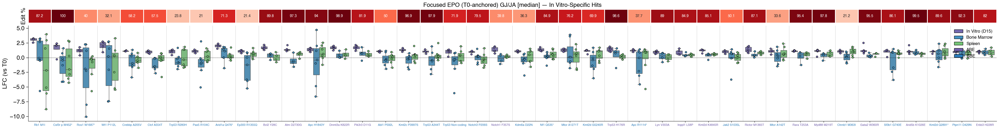

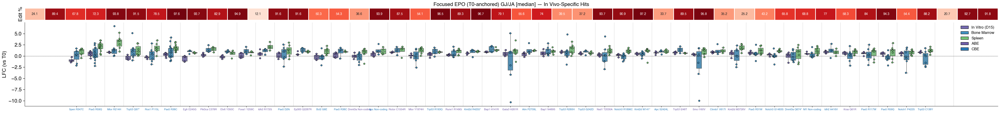

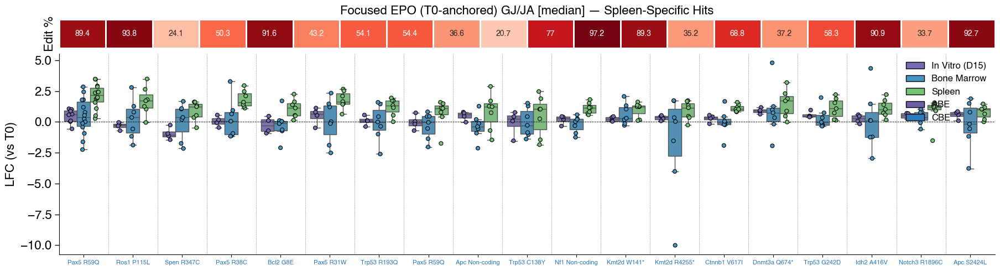

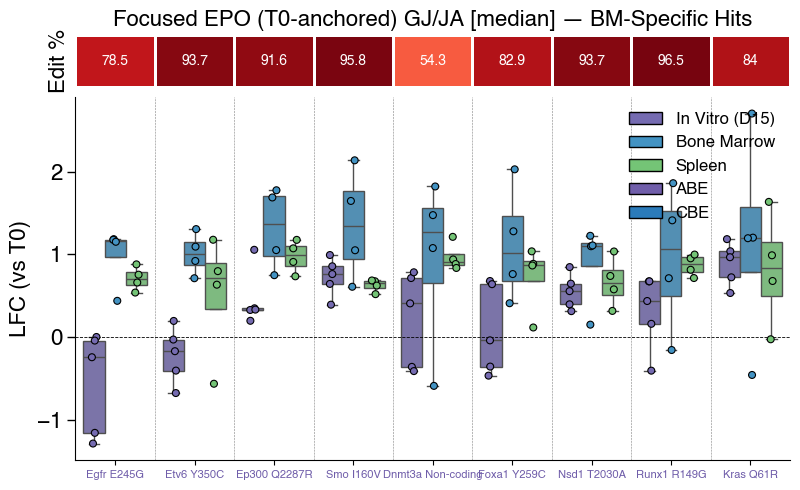


=== Focused EPO (BC-anchored) GJ/JA | effect=median ===
  In vitro-specific  : 29 guides
  In vivo-specific   : 113 guides
  Spleen-specific    : 50 guides
  BM-specific        : 49 guides


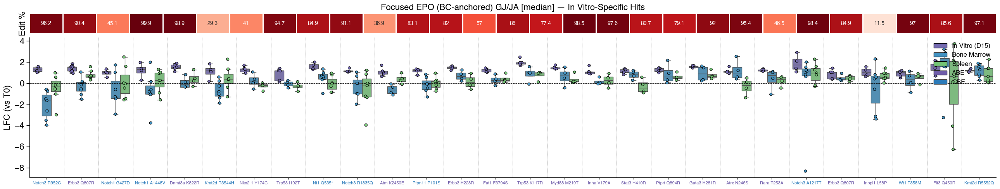

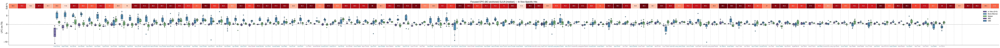

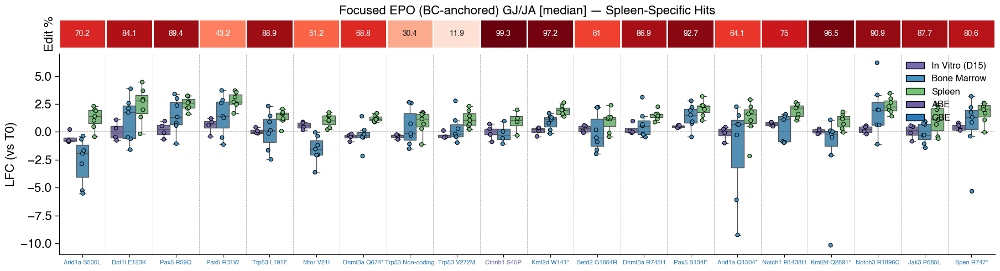

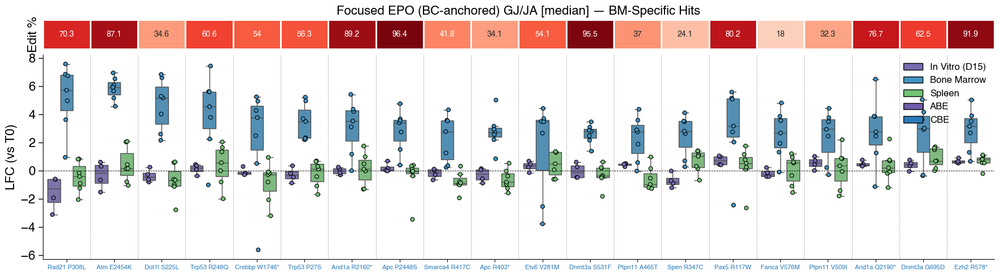


=== Focused EPO (T0-anchored) FSR | effect=median ===
  In vitro-specific  : 36 guides
  In vivo-specific   : 20 guides
  Spleen-specific    : 10 guides
  BM-specific        : 5 guides


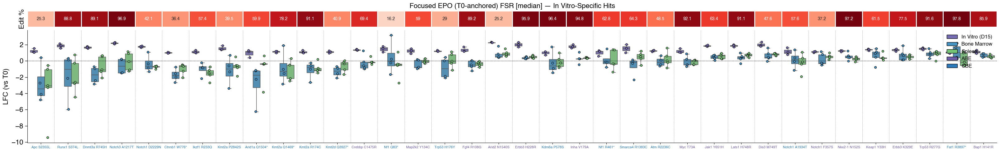

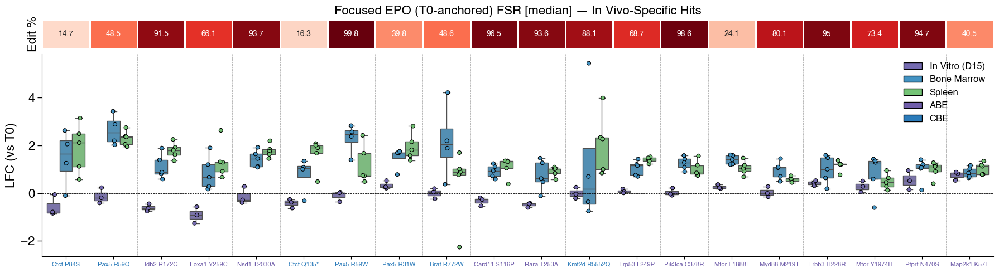

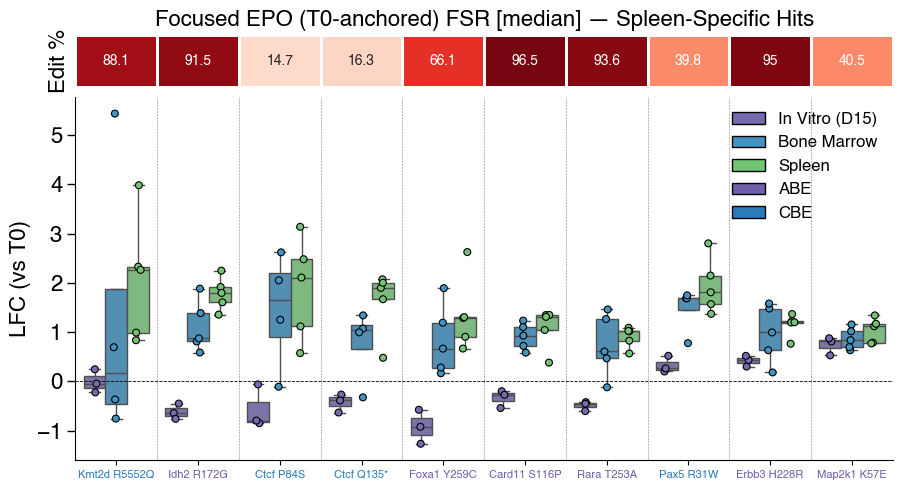

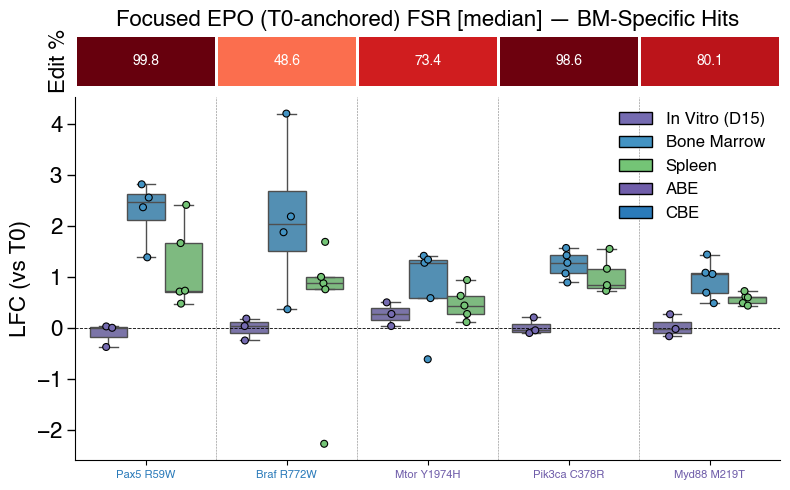


=== Focused EPO (BC-anchored) FSR | effect=median ===
  In vitro-specific  : 22 guides
  In vivo-specific   : 69 guides
  Spleen-specific    : 17 guides
  BM-specific        : 33 guides


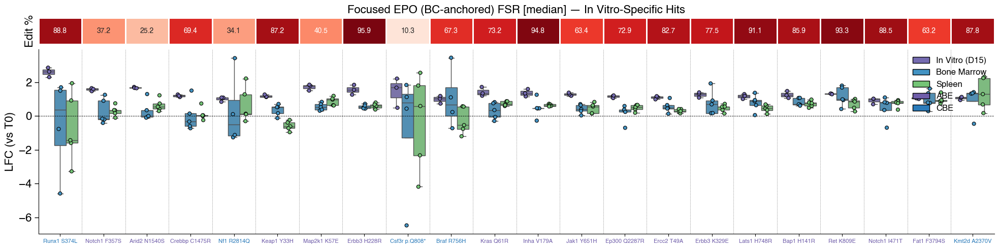

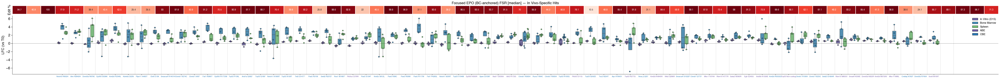

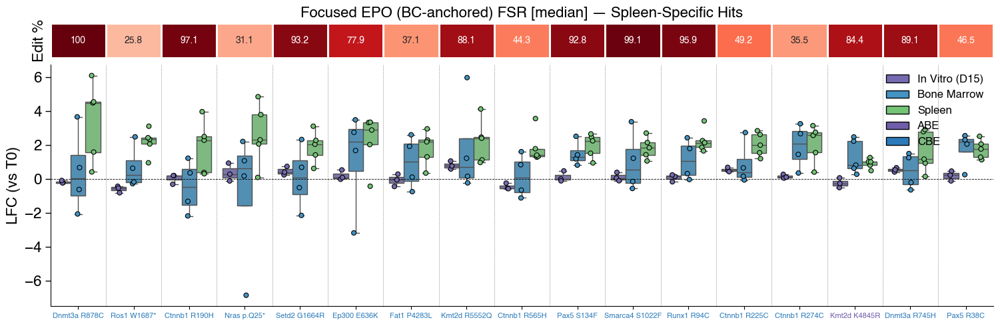

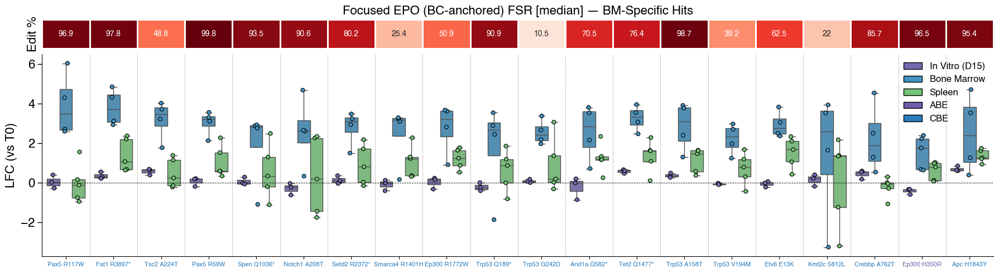


=== OG (T0-anchored) | effect=median ===
  In vitro-specific  : 39 guides
  In vivo-specific   : 412 guides
  Spleen-specific    : 271 guides
  BM-specific        : 34 guides


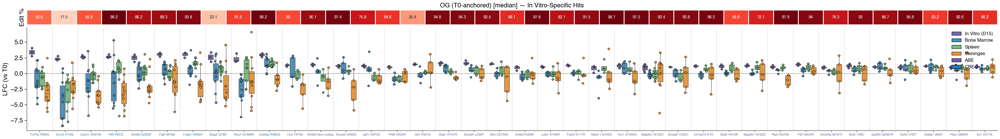

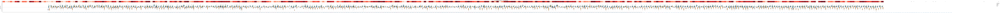

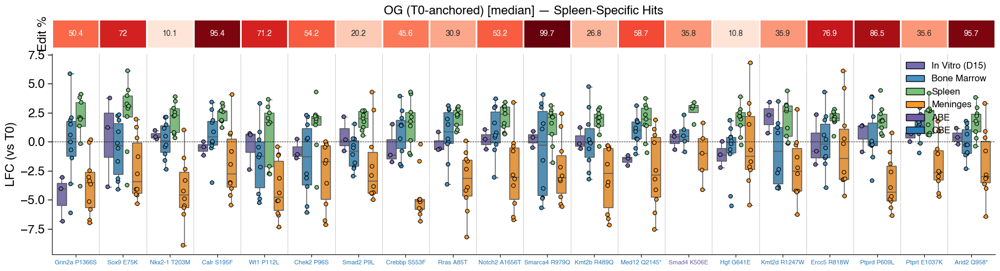

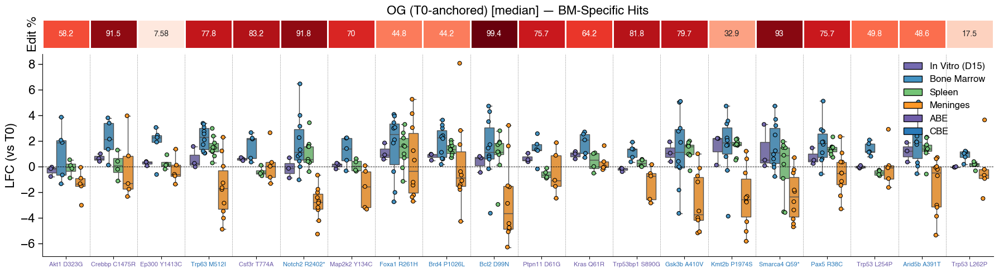

In [9]:
for abe_k, cbe_k, label, conds, og in [
    ('ABE_EPO_T0',     'CBE_EPO_T0',     'Focused EPO (T0-anchored) GJ/JA', conds_focused, False),
    ('ABE_EPO_BC',     'CBE_EPO_BC',     'Focused EPO (BC-anchored) GJ/JA', conds_focused, False),
    ('ABE_EPO_T0_FSR', 'CBE_EPO_T0_FSR', 'Focused EPO (T0-anchored) FSR',  conds_focused, False),
    ('ABE_EPO_BC_FSR', 'CBE_EPO_BC_FSR', 'Focused EPO (BC-anchored) FSR',  conds_focused, False),
    ('ABE_OG',         'CBE_OG',         'OG (T0-anchored)',                conds_og,      True),
]:
    if dfs.get(abe_k) is None or dfs.get(cbe_k) is None: continue
    tissue_specific_hits(abe_k, cbe_k, label, conditions=conds, is_og=og, effects=('median',))


In Vitro-Specific
  GJ/JA T0: 42 guides
  FSR T0: 36 guides
  OG: 39 guides


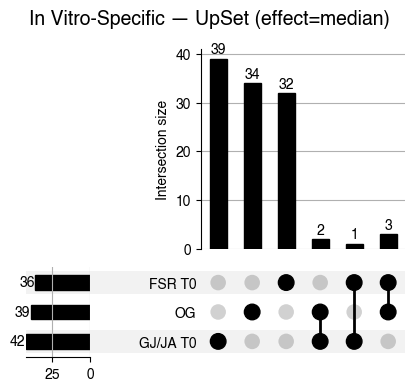

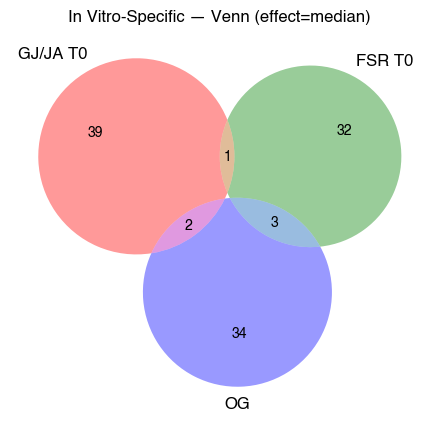


In Vivo-Specific
  GJ/JA T0: 48 guides
  FSR T0: 20 guides
  OG: 412 guides


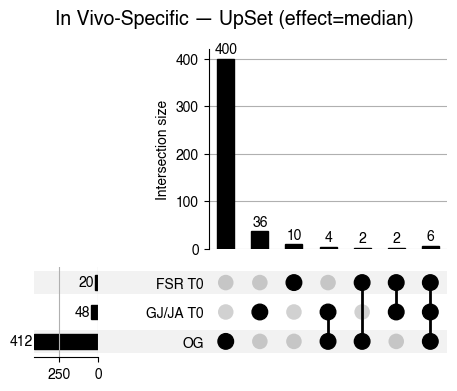

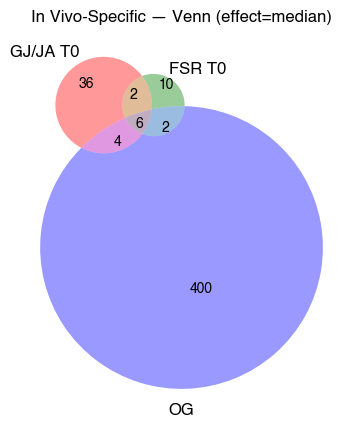


Spleen-Specific
  GJ/JA T0: 31 guides
  FSR T0: 10 guides
  OG: 271 guides


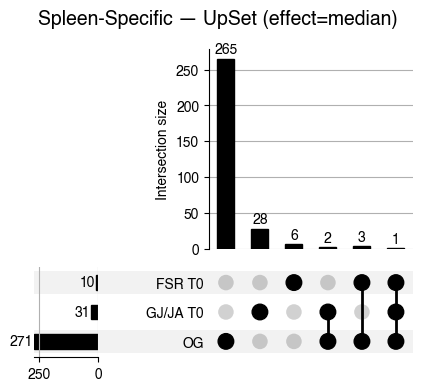

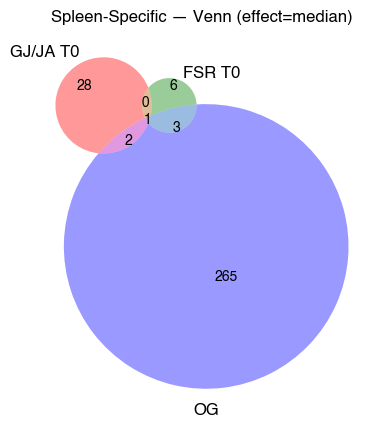


BM-Specific
  GJ/JA T0: 9 guides
  FSR T0: 5 guides
  OG: 34 guides


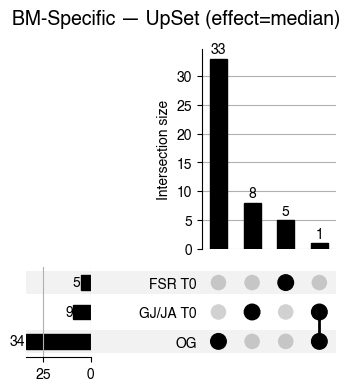

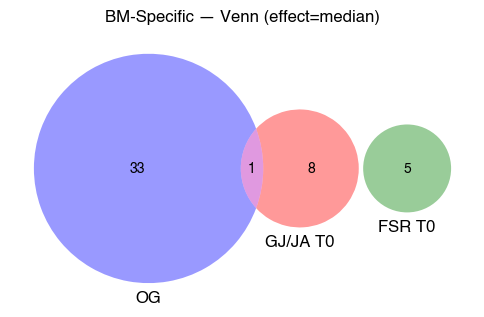

In [10]:
from upsetplot import from_contents, UpSet
from matplotlib_venn import venn2, venn3

def collect_specific_hits(abe_key, cbe_key, conditions, fdr_method='fishers',
                           fdr_cutoff=0.1, effect='median', lfc_cutoff=1.0,
                           min_sensor=100, min_edit=20, min_input=2, is_og=False):
    abe = dfs[abe_key].copy(); abe['Editor'] = 'ABE'
    cbe = dfs[cbe_key].copy(); cbe['Editor'] = 'CBE'
    combined = pd.concat([abe, cbe], ignore_index=True)
    targ = combined[combined['classification'] == 'targeting guide'].copy()
    in_conds = list(conditions)

    edit_cols   = [f'target_base_edit_perc_{c}' for c in in_conds if f'target_base_edit_perc_{c}' in targ.columns]
    sensor_cols = [f'sensor_reads_{c}'           for c in in_conds if f'sensor_reads_{c}'           in targ.columns]
    if edit_cols:   targ = targ[(targ[edit_cols]   >= min_edit  ).any(axis=1)]
    if sensor_cols: targ = targ[(targ[sensor_cols] >= min_sensor).any(axis=1)]
    if 'Input_median' in targ.columns:
        targ = targ[targ['Input_median'] >= min_input]

    invivo_conds = [c for c in in_conds if c != 'd15']
    def lfc_col(c): return f'LFC_{effect}_{c}'
    def fdr_col(c): return f'FDR_{c}_{fdr_method}'
    def not_strong(c):
        lc, fc = lfc_col(c), fdr_col(c)
        if lc not in targ.columns or fc not in targ.columns:
            return pd.Series(True, index=targ.index)
        return ~((targ[fc] < fdr_cutoff) & (targ[lc] >= lfc_cutoff))

    # delta score
    for c in in_conds:
        others = [lfc_col(o) for o in in_conds if o != c]
        if all(col in targ.columns for col in [lfc_col(c)] + others):
            targ[f'd_{c}'] = targ[lfc_col(c)] - targ[others].mean(axis=1)

    # category masks
    mask_iv = (targ[lfc_col('d15')] > lfc_cutoff) & (targ[fdr_col('d15')] < fdr_cutoff)
    for c in invivo_conds: mask_iv &= not_strong(c)

    mask_vivo = not_strong('d15')
    fdr_vivo = pd.Series(False, index=targ.index)
    for c in invivo_conds:
        if fdr_col(c) in targ.columns:
            fdr_vivo |= ((targ[fdr_col(c)] < fdr_cutoff) & (targ[lfc_col(c)] > lfc_cutoff))
    mask_vivo &= fdr_vivo

    mask_sp = pd.Series(False, index=targ.index)
    if 'spleen' in in_conds and lfc_col('spleen') in targ.columns:
        mask_sp = ((targ[lfc_col('spleen')] > lfc_cutoff) & (targ[fdr_col('spleen')] < fdr_cutoff)
                   & not_strong('d15'))
        if 'bm' in in_conds: mask_sp &= not_strong('bm')

    mask_bm = pd.Series(False, index=targ.index)
    if 'bm' in in_conds and lfc_col('bm') in targ.columns:
        mask_bm = ((targ[lfc_col('bm')] > lfc_cutoff) & (targ[fdr_col('bm')] < fdr_cutoff)
                   & not_strong('d15'))
        if 'spleen' in in_conds: mask_bm &= not_strong('spleen')

    return {
        'invitro': set(targ[mask_iv]['gRNA_id']),
        'invivo':  set(targ[mask_vivo]['gRNA_id']),
        'spleen':  set(targ[mask_sp]['gRNA_id']),
        'bm':      set(targ[mask_bm]['gRNA_id']),
    }


# ── collect hits for all screens
screen_configs = [
    ('ABE_EPO_T0',     'CBE_EPO_T0',     'GJ/JA T0',     conds_focused, False),
    ('ABE_EPO_T0_FSR', 'CBE_EPO_T0_FSR', 'FSR T0',       conds_focused, False),
    ('ABE_OG',         'CBE_OG',         'OG',           conds_og,      True),
]

all_hits = {}
for abe_k, cbe_k, label, conds, og in screen_configs:
    if dfs.get(abe_k) is None or dfs.get(cbe_k) is None: continue
    all_hits[label] = collect_specific_hits(abe_k, cbe_k, conds, is_og=og)

# ── plot: UpSet + Venn for each category
cat_labels = {
    'invitro': 'In Vitro-Specific',
    'invivo':  'In Vivo-Specific',
    'spleen':  'Spleen-Specific',
    'bm':      'BM-Specific',
}
screen_names = list(all_hits.keys())

for cat, cat_title in cat_labels.items():
    contents = {s: all_hits[s][cat] for s in screen_names}
    n_nonempty = sum(len(v) > 0 for v in contents.values())

    print(f'\n{"="*60}')
    print(f'{cat_title}')
    for s, ids in contents.items():
        print(f'  {s}: {len(ids)} guides')

    # ── UpSet
    if n_nonempty >= 2:
        fig = plt.figure(figsize=(10, 4))
        UpSet(from_contents(contents), show_counts=True).plot(fig)
        fig.suptitle(f'{cat_title} — UpSet (effect=median)', fontsize=14, fontweight='bold')
        plt.show()
    else:
        print(f'  [UpSet skipped — fewer than 2 non-empty sets]')
    
        # ── Venn (3-set, 正好3个screen)
    if len(screen_names) == 3:
        sets = [contents[s] for s in screen_names]
        fig, ax = plt.subplots(figsize=(6, 5))
        venn3(sets, set_labels=screen_names, ax=ax)
        ax.set_title(f'{cat_title} — Venn (effect=median)', fontsize=12, fontweight='bold')
        plt.show()
    elif len(screen_names) == 2:
        sets = [contents[s] for s in screen_names]
        fig, ax = plt.subplots(figsize=(5, 4))
        venn2(sets, set_labels=screen_names, ax=ax)
        ax.set_title(f'{cat_title} — Venn (effect=median)', fontsize=12, fontweight='bold')
        plt.show()



## plot share in vivo specific hits

Triple overlap: 6 guides


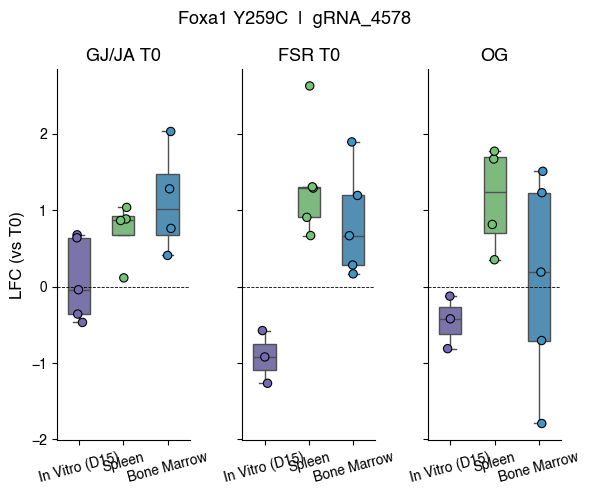

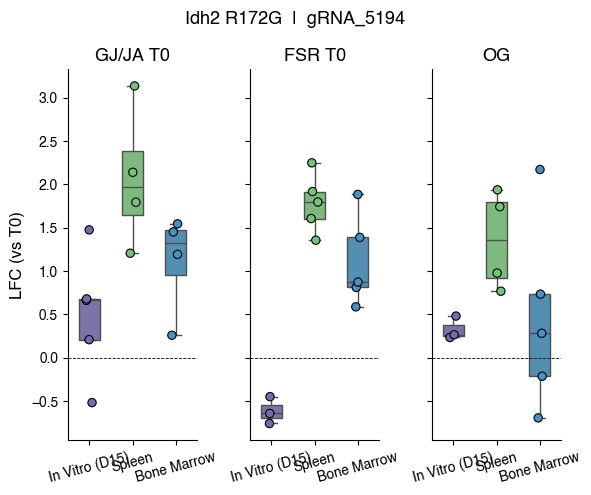

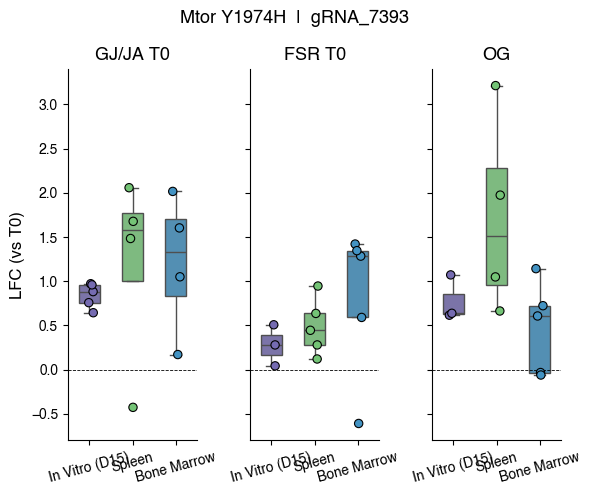

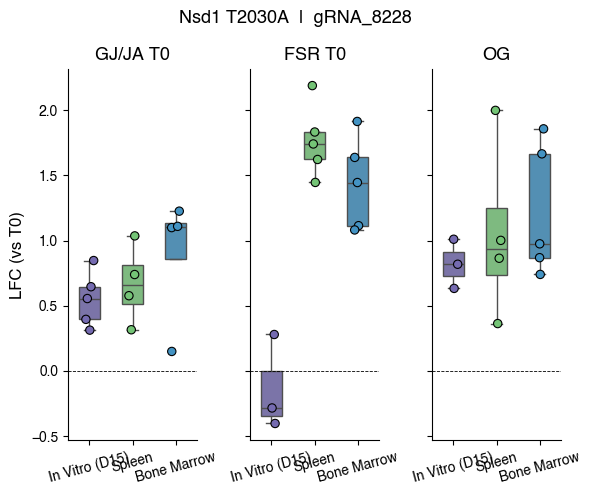

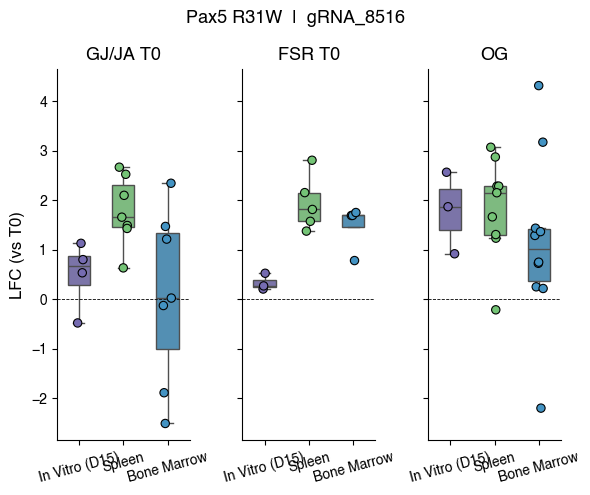

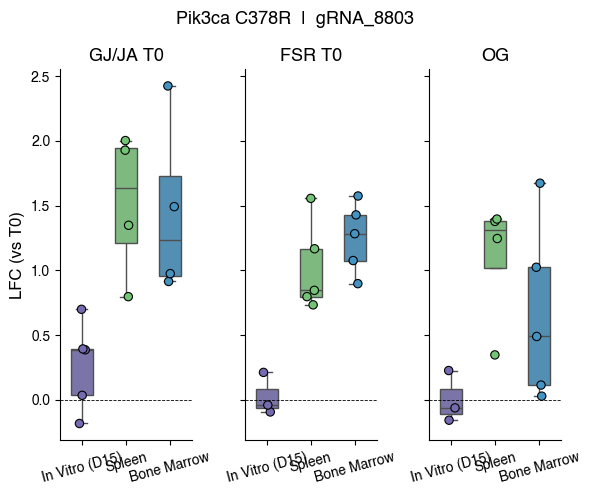

In [13]:
triple_invivo = (all_hits['GJ/JA T0']['invivo']
                 & all_hits['FSR T0']['invivo']
                 & all_hits['OG']['invivo'])
print(f'Triple overlap: {len(triple_invivo)} guides')

screen_data = {
    'GJ/JA T0': (pd.concat([dfs['ABE_EPO_T0'].assign(Editor='ABE'),
                             dfs['CBE_EPO_T0'].assign(Editor='CBE')], ignore_index=True),
                 {'ABE': _ABE_SAMP, 'CBE': _CBE_SAMP}),
    'FSR T0':   (pd.concat([dfs['ABE_EPO_T0_FSR'].assign(Editor='ABE'),
                             dfs['CBE_EPO_T0_FSR'].assign(Editor='CBE')], ignore_index=True),
                 {'ABE': _ABE_SAMP_FSR, 'CBE': _CBE_SAMP_FSR}),
    'OG':       (pd.concat([dfs['ABE_OG'].assign(Editor='ABE'),
                             dfs['CBE_OG'].assign(Editor='CBE')], ignore_index=True),
                 {'ABE': _ABE_SAMP_OG, 'CBE': _CBE_SAMP_OG}),
}
plot_tissues = ('d15', 'spleen', 'bm')
screen_order = ['GJ/JA T0', 'FSR T0', 'OG']

for gid in sorted(triple_invivo):
    fig, axes = plt.subplots(1, 3, figsize=(6, 5), sharey=True)
    mut_label = None

    for ax, scr in zip(axes, screen_order):
        df_scr, samp_by_ed = screen_data[scr]
        rows = df_scr[df_scr['gRNA_id'] == gid]

        records = []
        for _, row in rows.iterrows():
            editor = row.get('Editor', 'ABE')
            samp_dict = samp_by_ed[editor]
            if mut_label is None:
                mg = str(row.get('gene_name_m_corrected', row.get('Gene', '')))
                mv = str(row.get('HGVSp_m', ''))
                hv = str(row.get('HGVSp_h', ''))
                if hv.startswith('p.'): hv = hv[2:]
                if mv == 'Not calculated (legacy)': mv = hv
                mut_label = f'{mg} {mv}'
            for tissue in plot_tissues:
                for rep_col in samp_dict.get(tissue, []):
                    if rep_col in row.index:
                        records.append({'Tissue': tissue, 'LFC': row[rep_col]})

        plot_df = pd.DataFrame(records)
        if plot_df.empty:
            ax.set_visible(False); continue

        palette = [_TISSUE_COLOR[t] for t in plot_tissues]
        sns.boxplot(data=plot_df, x='Tissue', y='LFC', order=list(plot_tissues),
                    palette=palette, showfliers=False, ax=ax, width=0.5, linewidth=1)
        sns.stripplot(data=plot_df, x='Tissue', y='LFC', order=list(plot_tissues),
                      palette=palette, edgecolor='black', linewidth=0.8, size=6,
                      dodge=False, ax=ax)
        ax.axhline(0, linestyle='--', color='black', linewidth=0.6)
        ax.set_title(scr, fontsize=13, fontweight='bold')
        ax.set_xlabel('')
        ax.set_ylabel('LFC (vs T0)' if scr == screen_order[0] else '', fontsize=12)
        ax.set_xticklabels([_TISSUE_LABEL[t] for t in plot_tissues], fontsize=10, rotation=15)
        ax.spines[['top', 'right']].set_visible(False)

    fig.suptitle(f'{mut_label}  |  {gid}', fontsize=13, fontweight='bold')
    fig.tight_layout()
    plt.show()
